In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import hdbscan
import numpy as np
import pandas as pd 
import torch
import os

In [3]:
path = "./models/dataset/from_pfts_study_reset17072025/"
df = pd.read_csv(os.path.join(path, 'tensor_df_space_200_study_brewin_done_zone_done_translate_done.csv'))
latitude = torch.load(os.path.join(path, 'tensor_latitude_space_200_pfts.pt'))
longitude = torch.load(os.path.join(path, 'tensor_longitude_space_200_pfts.pt'))
picture = torch.load(os.path.join(path, 'tensor_picture_space_200_pfts.pt'))

latitude = latitude.permute(1, 0, 2)
longitude = longitude.permute(1, 0, 2)

nb_lines = int(longitude.shape[0]/7)
latitude = latitude.reshape(nb_lines,7,100)
longitude = longitude.reshape(nb_lines,7,550)
picture = picture.reshape(nb_lines,18,100,550)


/tmp/ipykernel_309127/1398054758.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  latitude = torch.load(os.path.join(path, 'tensor_latitude_space_200_pfts.pt'))
/tmp/ipyk

In [4]:
picture.shape

torch.Size([8922, 18, 100, 550])

In [5]:
df['index'] = df.index

In [29]:
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year

all_dfs = []
unique_cluster_id = 0

for year, group in df.groupby('year'):
    print(f"== Clustering pour l'année {year} ==")

    group = group.copy()
    group['days_since_start'] = (group['date'] - group['date'].min()).dt.days

    features = np.column_stack([
        group['lat'].values,
        group['lon'].values,
        group['days_since_start'].values / 5
    ])

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    clusterer = hdbscan.HDBSCAN(min_cluster_size=5, max_cluster_size=50, metric='euclidean')
    labels = clusterer.fit_predict(features_scaled)
    
    group['cluster'] = labels

    unclustered_points = group[group['cluster'] == -1].copy()
    unclustered_points['cluster'] = [f"{year}_U{unique_cluster_id + i:04d}" for i in range(len(unclustered_points))]
    unique_cluster_id += len(unclustered_points)

    clustered_points = group[group['cluster'] != -1].copy()
    clustered_points['cluster'] = clustered_points['cluster'].apply(lambda c: f"{year}_{int(c):04d}")

    group = pd.concat([clustered_points, unclustered_points])

    all_dfs.append(group)

df_clustered = pd.concat(all_dfs, ignore_index=True)

print(f"Nombre total de points clusterisés : {len(df_clustered)}")
print(f"Nombre total de clusters : {df_clustered['cluster'].nunique()}")


== Clustering pour l'année 1997 ==
== Clustering pour l'année 1998 ==
== Clustering pour l'année 1999 ==
== Clustering pour l'année 2000 ==
== Clustering pour l'année 2001 ==
== Clustering pour l'année 2002 ==
== Clustering pour l'année 2003 ==
== Clustering pour l'année 2004 ==
== Clustering pour l'année 2005 ==
== Clustering pour l'année 2006 ==
== Clustering pour l'année 2007 ==
== Clustering pour l'année 2008 ==
== Clustering pour l'année 2009 ==
== Clustering pour l'année 2010 ==
== Clustering pour l'année 2011 ==
== Clustering pour l'année 2012 ==
== Clustering pour l'année 2013 ==
== Clustering pour l'année 2014 ==
== Clustering pour l'année 2015 ==
== Clustering pour l'année 2016 ==
== Clustering pour l'année 2017 ==
== Clustering pour l'année 2018 ==
== Clustering pour l'année 2019 ==
== Clustering pour l'année 2020 ==
== Clustering pour l'année 2021 ==
Nombre total de points clusterisés : 8922
Nombre total de clusters : 1805


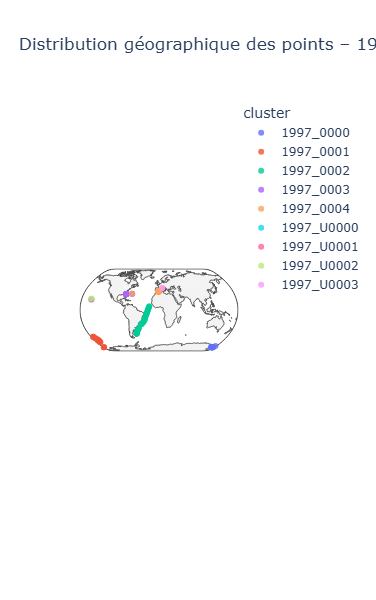

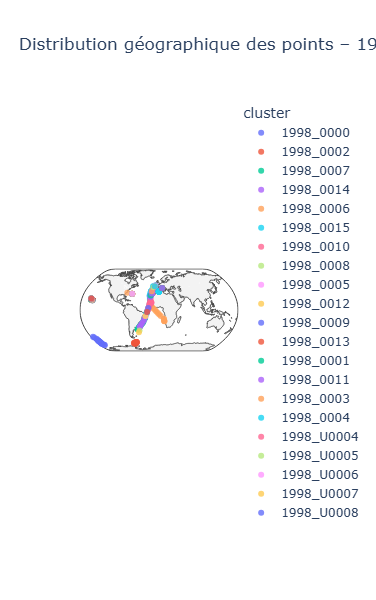

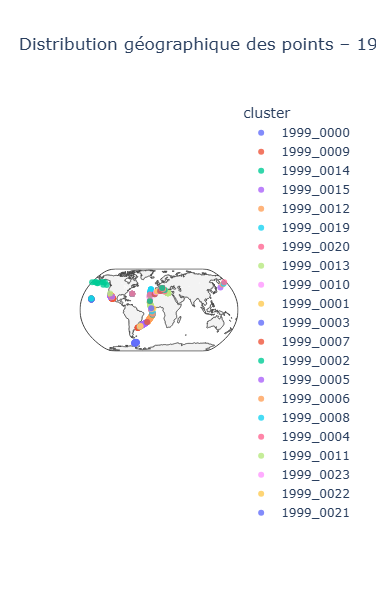

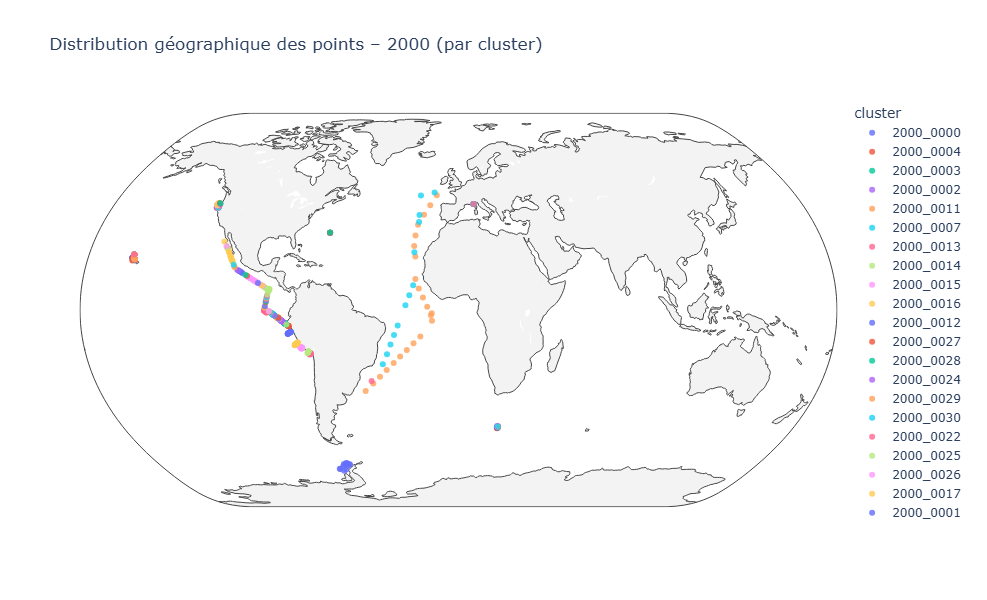

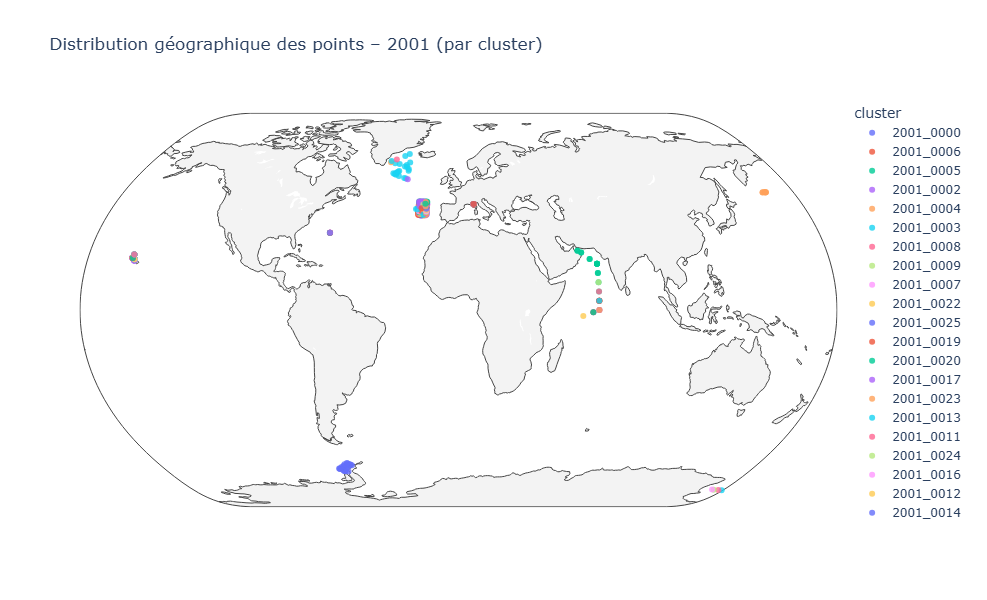

...

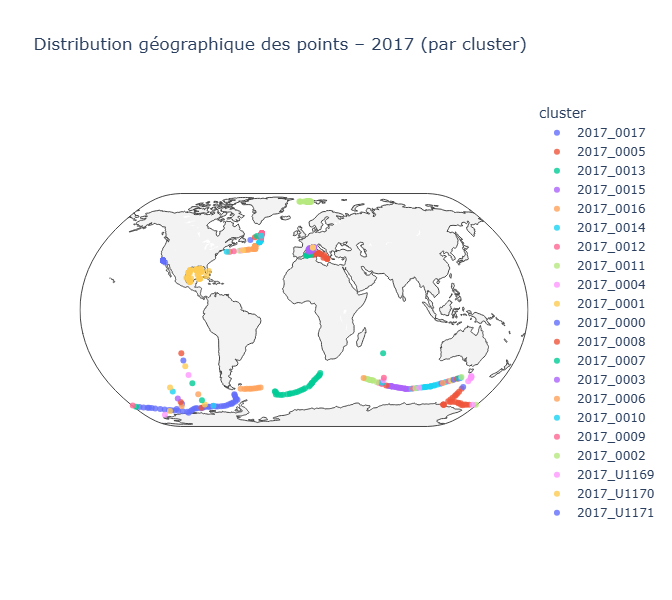

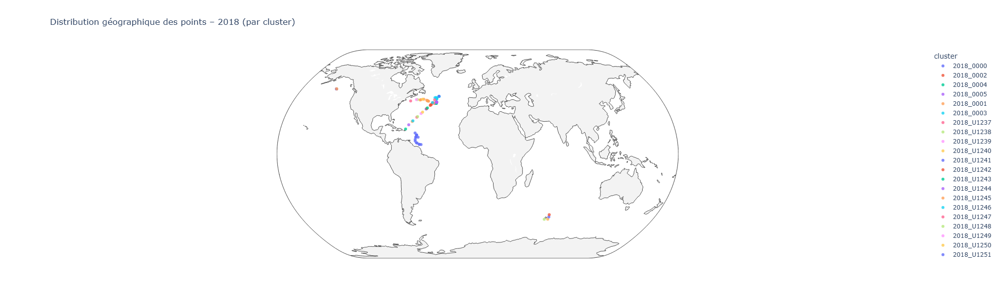

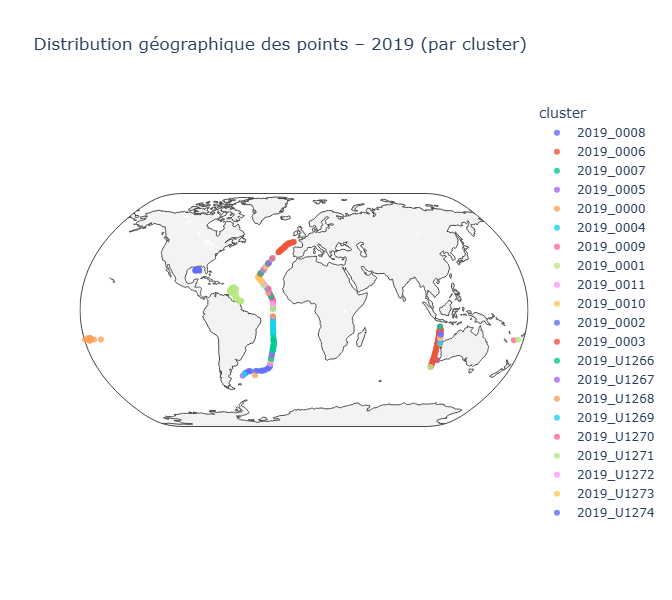

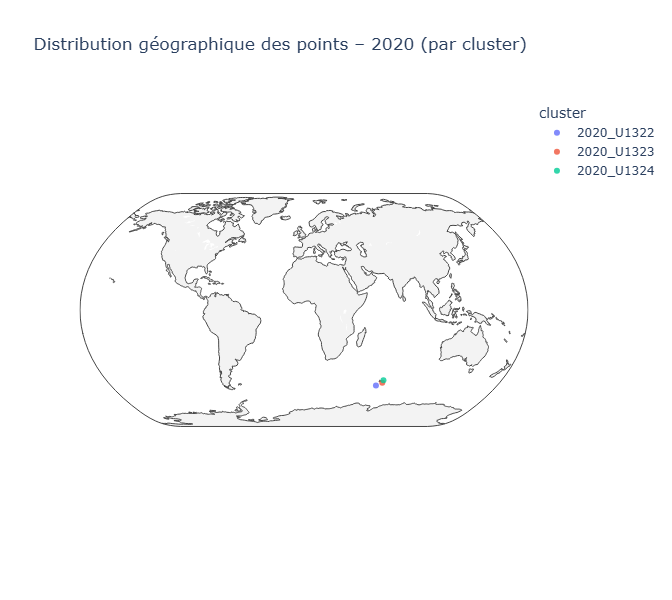

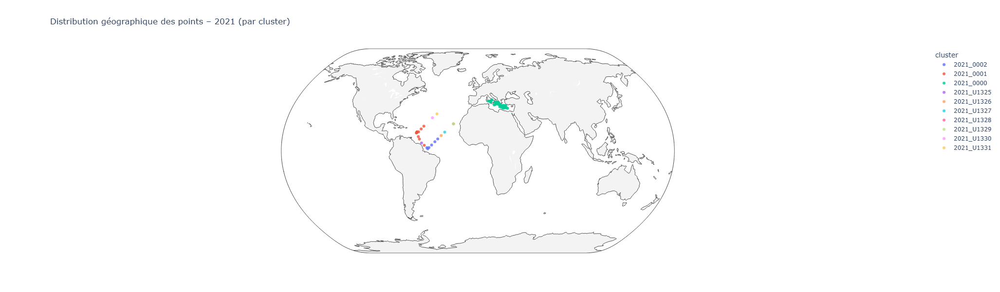

In [30]:
# Liste des années uniques triées
years = sorted(df_clustered['year'].dropna().unique())

# Boucle sur chaque année
for year in years:
    df_year = df_clustered[df_clustered['year'] == year].copy()

    # Création de l'infobulle
    df_year['hover_text'] = df_year.apply(
        lambda row: f"Date: {row['date'].date()}<br>"
                    f"TChla: {row['tchla']}<br>"
                    f"Micro: {row['micro_chla B']}<br>"
                    f"Nano: {row['nano_chla B']}<br>"
                    f"Pico: {row['pico_chla B']}<br>"
                    f"Cluster: {row['cluster']}", axis=1
    )

    # Création de la carte
    fig = px.scatter_geo(
        df_year,
        lat='lat',
        lon='lon',
        color='cluster',
        hover_name='date',
        hover_data={'lat': False, 'lon': False, 'cluster': False, 'hover_text': True},
        title=f"Distribution géographique des points – {year} (par cluster)",
        opacity=0.8
    )

    # Mise en forme de la carte
    fig.update_traces(marker=dict(size=6))
    fig.update_layout(
        geo=dict(
            showland=True,
            landcolor="rgb(243, 243, 243)",
            projection_type='natural earth'
        ),
        hoverlabel=dict(bgcolor="white", font_size=11),
        width=1000,
        height=600
    )

    fig.show()



In [31]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Supposons que df_clustered soit votre DataFrame initial
df = df_clustered.copy()
df = df.dropna(subset=['tchla'])

# Obtenez les identifiants de cluster uniques
cluster_ids = df['cluster'].unique()

# Divisez les identifiants de cluster en ensembles train, validation et test
train_clusters, temp_clusters = train_test_split(cluster_ids, test_size=0.4, random_state=2)
val_clusters, test_clusters = train_test_split(temp_clusters, test_size=0.5, random_state=2)

# Filtrez le DataFrame original pour créer les ensembles train, validation et test
df_train = df[df['cluster'].isin(train_clusters)]
df_val = df[df['cluster'].isin(val_clusters)]
df_test = df[df['cluster'].isin(test_clusters)]

# Vérifiez les résultats
print(f"Train set size: {len(df_train)}")
print(f"Validation set size: {len(df_val)}")
print(f"Test set size: {len(df_test)}")



Train set size: 4986
Validation set size: 1856
Test set size: 2080


In [42]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Supposons que df_clustered soit votre DataFrame initial
df = df_clustered.copy()

# Créer des bins pour la variable 'tchla'
df['tchla_bin'] = pd.qcut(df['tchla'], q=20, duplicates='drop')

# Créer un DataFrame intermédiaire pour la stratification
cluster_info = df.groupby('cluster').first().reset_index()
cluster_info = cluster_info[['cluster', 'tchla_bin']]

# Diviser les clusters en train, validation et test en utilisant la stratification sur 'tchla_bin'
train_clusters, temp_clusters = train_test_split(
    cluster_info['cluster'],
    test_size=0.2,
    stratify=cluster_info['tchla_bin'],
    random_state=2
)

val_clusters, test_clusters = train_test_split(
    temp_clusters,
    test_size=0.5,
    stratify=cluster_info[cluster_info['cluster'].isin(temp_clusters)]['tchla_bin'],
    random_state=2
)

# Filtrer le DataFrame original pour créer les ensembles train, validation et test
df_train = df[df['cluster'].isin(train_clusters)]
df_val = df[df['cluster'].isin(val_clusters)]
df_test = df[df['cluster'].isin(test_clusters)]

# Vérifiez les résultats
print(f"Train set size: {len(df_train)}")
print(f"Validation set size: {len(df_val)}")
print(f"Test set size: {len(df_test)}")

# Vérifiez la distribution de 'tchla' dans chaque ensemble
print("\nDistribution de 'tchla' dans chaque ensemble :")
print("Train tchla distribution:\n", df_train['tchla_bin'].value_counts(normalize=True))
print("Validation tchla distribution:\n", df_val['tchla_bin'].value_counts(normalize=True))
print("Test tchla distribution:\n", df_test['tchla_bin'].value_counts(normalize=True))


Train set size: 7229
Validation set size: 758
Test set size: 935

Distribution de 'tchla' dans chaque ensemble :
Train tchla distribution:
 tchla_bin
(0.074, 0.089]                     0.054226
(0.0078000000000000005, 0.0472]    0.053396
(1.617, 12.301]                    0.052566
(0.0615, 0.074]                    0.052289
(0.103, 0.119]                     0.051874
(0.287, 0.338]                     0.051044
(0.212, 0.244]                     0.051044
(0.089, 0.103]                     0.050491
(0.338, 0.405]                     0.050491
(0.601, 0.758]                     0.049938
(0.0472, 0.0615]                   0.049661
(0.758, 1.018]                     0.049523
(0.484, 0.601]                     0.049384
(0.138, 0.16]                      0.049246
(0.244, 0.287]                     0.049246
(0.119, 0.138]                     0.048831
(0.187, 0.212]                     0.048831
(0.16, 0.187]                      0.046756
(0.405, 0.484]                     0.046479
(1.018, 1.617]

/tmp/ipykernel_309127/3205199060.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/3205199060.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/3205199060.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



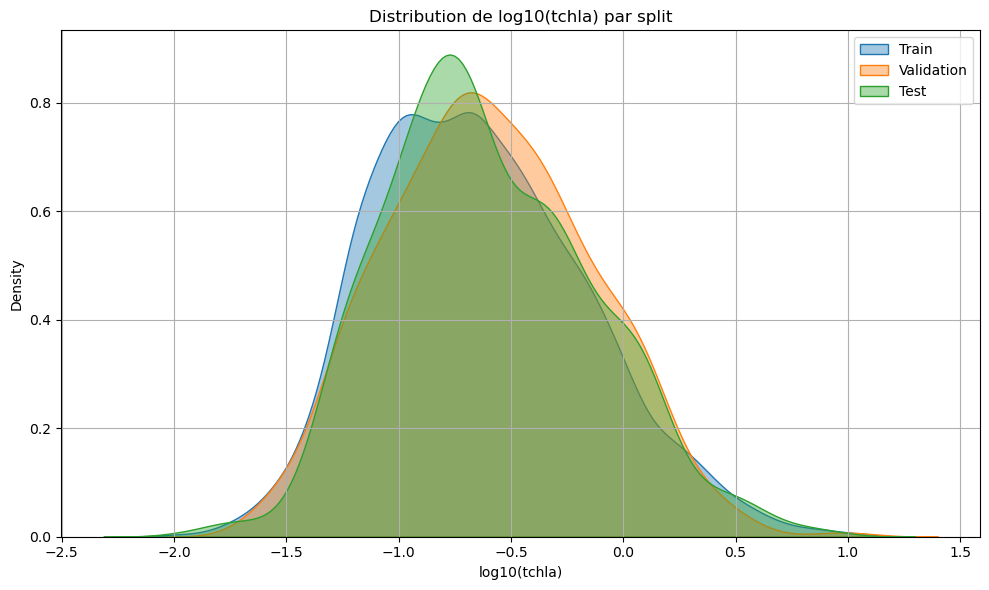

In [43]:
# Ajouter une colonne log10(tchla) dans chaque split (filtrée pour valeurs > 0)
df_train['log10_tchla'] = np.log10(df_train['tchla'].clip(lower=1e-6))
df_val['log10_tchla'] = np.log10(df_val['tchla'].clip(lower=1e-6))
df_test['log10_tchla'] = np.log10(df_test['tchla'].clip(lower=1e-6))

# Tracé
plt.figure(figsize=(10, 6))
sns.kdeplot(df_train['log10_tchla'], label='Train', fill=True, alpha=0.4)
sns.kdeplot(df_val['log10_tchla'], label='Validation', fill=True, alpha=0.4)
sns.kdeplot(df_test['log10_tchla'], label='Test', fill=True, alpha=0.4)

plt.xlabel("log10(tchla)")
plt.ylabel("Density")
plt.title("Distribution de log10(tchla) par split")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [44]:
df_train['split'] = 'train'
df_val['split'] = 'val'
df_test['split'] = 'test'

df_all = pd.concat([df_train, df_val, df_test], ignore_index=True)
df_all = df_all.sort_values(by='index')

/tmp/ipykernel_309127/3441738451.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/3441738451.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/3441738451.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



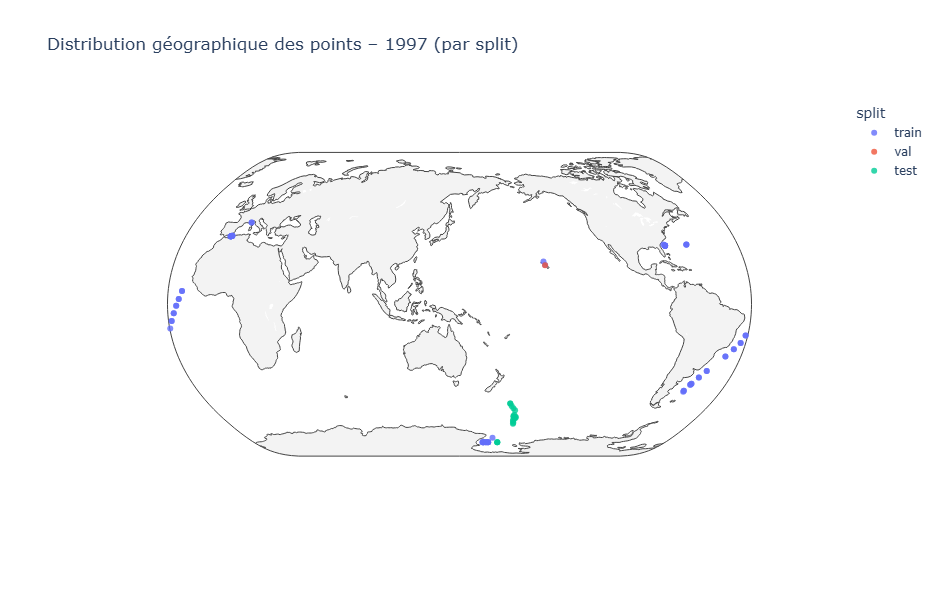

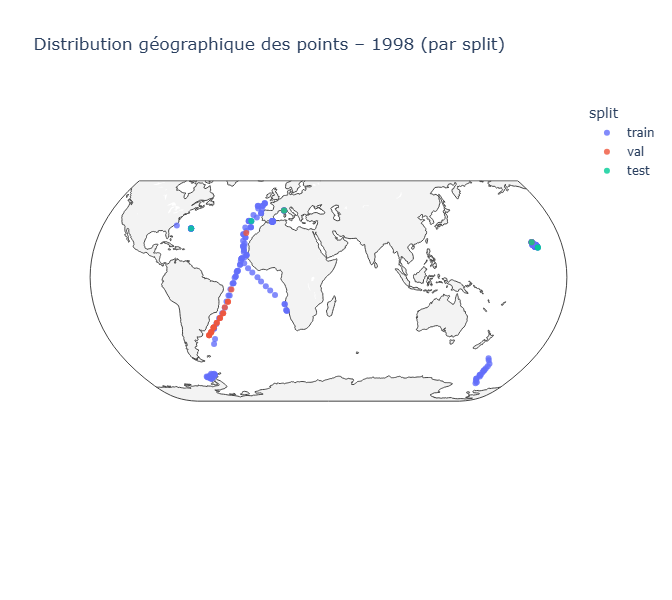

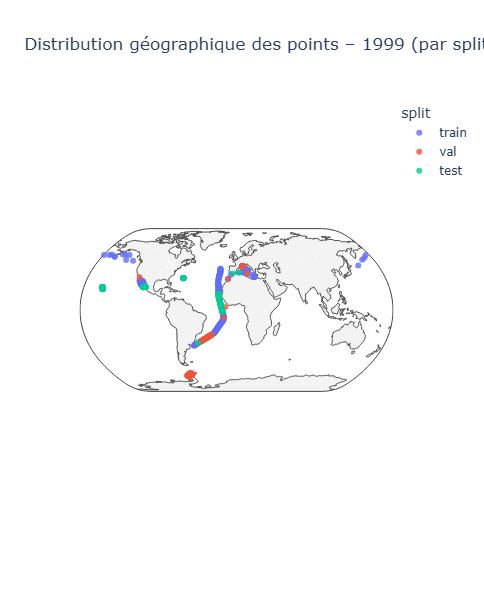

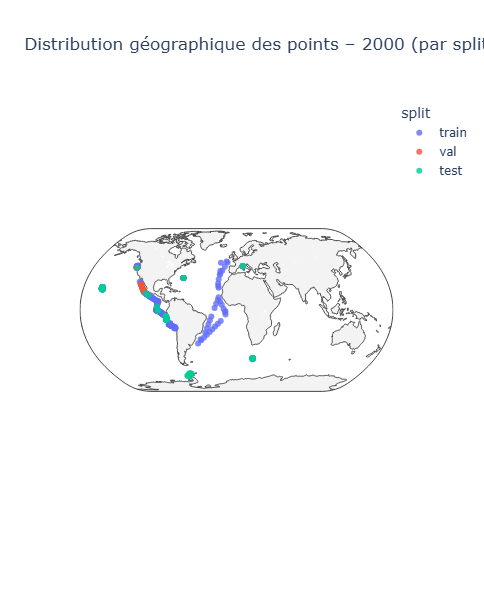

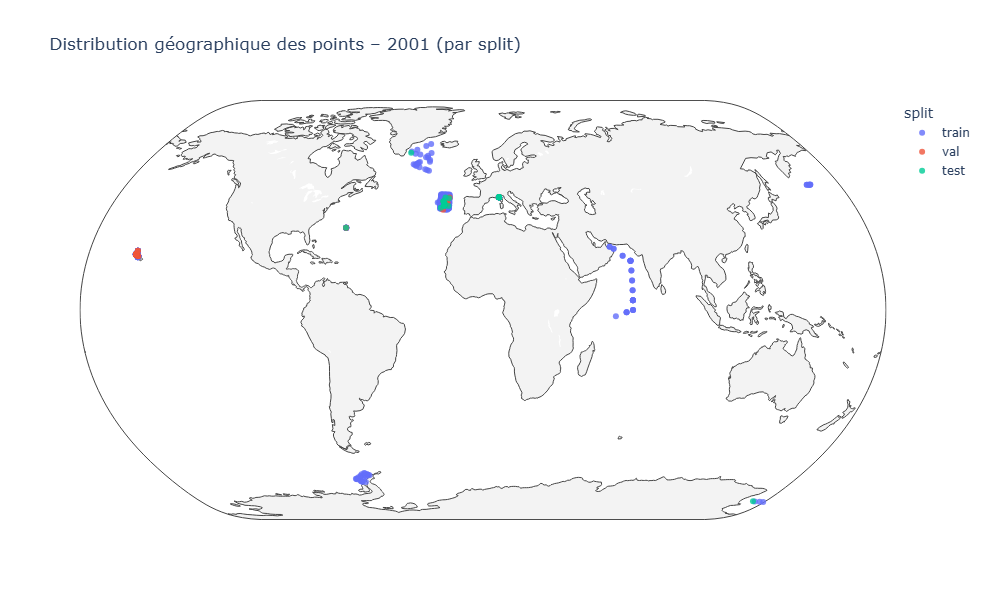

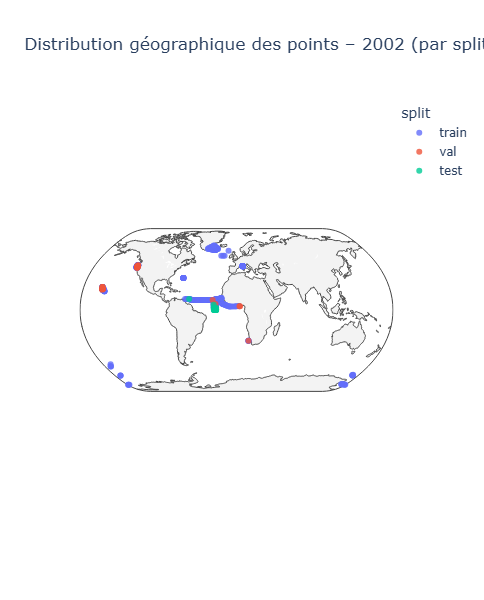

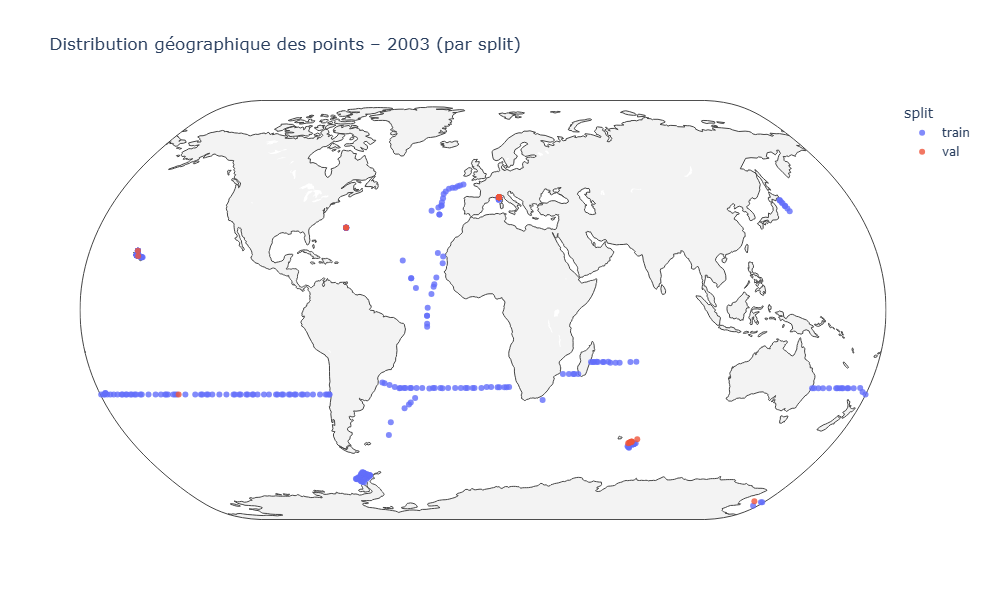

In [45]:
import pandas as pd
import plotly.express as px

# Liste des années uniques triées
years = sorted(df_all['year'].dropna().unique())

# Boucle sur chaque année
for year in years:
    df_year = df_all[df_all['year'] == year].copy()

    # Création de l'infobulle
    df_year['hover_text'] = df_year.apply(
        lambda row: f"Date: {row['date'].date()}<br>"
                    f"TChla: {row['tchla']}<br>"
                    f"Micro: {row['micro_chla B']}<br>"
                    f"Nano: {row['nano_chla B']}<br>"
                    f"Pico: {row['pico_chla B']}<br>"
                    f"Cluster: {row['cluster']}", axis=1
    )

    # Carte avec couleurs par split
    fig = px.scatter_geo(
        df_year,
        lat='lat',
        lon='lon',
        color='split',  # <- Couleur par ensemble
        hover_name='date',
        hover_data={'lat': False, 'lon': False, 'cluster': False, 'hover_text': True},
        title=f"Distribution géographique des points – {year} (par split)",
        opacity=0.8,
        category_orders={'split': ['train', 'val', 'test']}  # Pour ordre fixe
    )

    # Mise en forme
    fig.update_traces(marker=dict(size=6))
    fig.update_layout(
        geo=dict(
            showland=True,
            landcolor="rgb(243, 243, 243)",
            projection_type='natural earth'
        ),
        hoverlabel=dict(bgcolor="white", font_size=11),
        width=1000,
        height=600
    )

    fig.show()


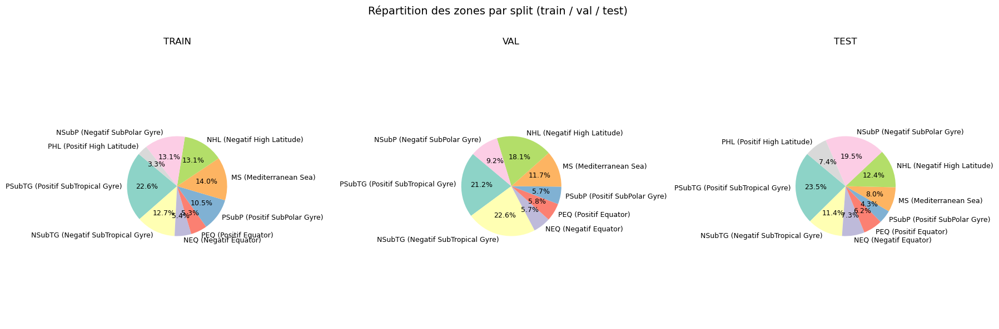

In [46]:
import matplotlib.pyplot as plt

# Liste fixe des zones (dans l'ordre que tu veux)
zones = ['PSubTG (Positif SubTropical Gyre)',
         'NSubTG (Negatif SubTropical Gyre)',
         'NEQ (Negatif Equator)',
         'PEQ (Positif Equator)',
         'PSubP (Positif SubPolar Gyre)',
         'MS (Mediterranean Sea)',
         'NHL (Negatif High Latitude)',
         'NSubP (Negatif SubPolar Gyre)',
         'PHL (Positif High Latitude)']

# Palette de couleurs fixe, 9 couleurs dans Set3
colors = plt.cm.Set3.colors[:len(zones)]

# Mapping zone -> couleur
color_map = dict(zip(zones, colors))

# Préparer la figure
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Définir les splits
splits = ['train', 'val', 'test']

for i, split in enumerate(splits):
    df_split = df_all[df_all['split'] == split]
    zone_counts = df_split['zone'].value_counts()
    
    # Prendre toutes les zones dans l'ordre de la liste, même celles absentes dans le split (pour la cohérence)
    sizes = [zone_counts.get(zone, 0) for zone in zones]

    # Filtrer les zones avec taille > 0 (pour ne pas afficher des parts nulles)
    filtered_labels = [z for z, s in zip(zones, sizes) if s > 0]
    filtered_sizes = [s for s in sizes if s > 0]
    filtered_colors = [color_map[z] for z in filtered_labels]

    axes[i].pie(
        filtered_sizes,
        labels=filtered_labels,
        autopct='%1.1f%%',
        startangle=140,
        colors=filtered_colors,
        textprops={'fontsize': 9}
    )
    axes[i].axis('equal')
    axes[i].set_title(f'{split.upper()}')

# Titre global
plt.suptitle('Répartition des zones par split (train / val / test)', fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.85)
plt.show()


In [47]:
df_all = df_all = df_all.rename(columns = {
    "split":"set"
})
df_all["index"] = df_all.index

In [48]:
df_final = df_all[['lat','lon','date','tchla','micro_chla B', 'nano_chla B', 'pico_chla B','set', 'zone', 'ocean']]
df_final['date'] = df_all['date'].astype(str).str.replace("-", "")

df_final['year'] = df_final['date'].str[:4].astype(int)
df_final['month'] = df_final['date'].str[4:6].astype(int)
df_final['day'] = df_final['date'].str[6:8].astype(int)

df_final['date'] = df_final['date'].astype(str).str.replace("-", "")

df_final['year'] = df_final['date'].str[:4].astype(int)
df_final['month'] = df_final['date'].str[4:6].astype(int)
df_final['day'] = df_final['date'].str[6:8].astype(int)

df_final = df_final.drop(columns=['date'])
df_final.head()

/tmp/ipykernel_309127/1655101082.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/1655101082.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_309127/1655101082.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykerne

,lat,lon,tchla,micro_chla B,nano_chla B,pico_chla B,set,zone,ocean,year,month,day
2211,-79.366667,176.9500,1.070047,0.393358,0.676689,0.00000,train,NHL (Negatif High Latitude),AnW (Antartic Waters),2003,12,29
3009,-78.626300,-164.7242,1.112000,0.590116,0.521884,0.00000,train,NHL (Negatif High Latitude),AnW (Antartic Waters),2006,1,13
3010,-78.506600,-164.9374,1.106000,0.695090,0.406350,0.00456,train,NHL (Negatif High Latitude),AnW (Antartic Waters),2006,1,14
3011,-78.484900,-164.6109,0.728000,0.530937,0.197063,0.00000,train,NHL (Negatif High Latitude),AnW (Antartic Waters),2006,1,13
3012,-78.413600,-165.0671,0.876000,0.655686,0.220314,0.00000,train,NHL (Negatif High Latitude),AnW (Antartic Waters),2006,1,13


In [49]:
set_mapping = {"train": 0.0, "val": 1.0, "test": 2.0}
df_final["set"] = df_final["set"].map(set_mapping)
df_final['saved_index'] = df_final.index
df_final.to_csv("df_saved_step2_index.csv")
df_final = df_final[['lat','lon','year','month','day','tchla','micro_chla B', 'nano_chla B', 'pico_chla B','set','saved_index']]

In [50]:
tensor_df = torch.tensor(df_final.values, dtype=torch.float32)


In [51]:
column_dict = {col: idx for idx, col in enumerate(['lat',	'lon',	'year','month','day',	'tchla','micro_chla B', 'nano_chla B', 'pico_chla B','set',	'saved_index'])}
torch.save(tensor_df, "final_df_split_pfts_study.pt")
space_buffer = 200
torch.save(picture, f"final_picture_space_{space_buffer}_pfts_study.pt")
torch.save(latitude, f"final_latitude_space_{space_buffer}_pfts_study.pt")
torch.save(longitude, f"final_longitude_space_{space_buffer}_pfts_study.pt")

In [52]:
df_final.shape, df_final[df_final['set']==0].shape,df_final[df_final['set']==1].shape,df_final[df_final['set']==2].shape

((8922, 11), (7229, 11), (758, 11), (935, 11))